Final Assignment of Yaofa Gong 306299097

This assignment refines and adapts the midterm assignment. I used a further approach (quantitative correlation coefficient metrics) to more visually characterize the relationship between the age distribution and the distribution of accidents. Additionally, the data from two specific regions were compared to discuss the problem more closely.

# Import Python libraries

In [4]:
# to read and wrangle data
import pandas as pd
import numpy as np
from shapely.geometry import Point

# to import data from LA Data portal
from sodapy import Socrata

# to create spatial data
import geopandas as gpd

# for basemaps
import contextily as ctx

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

import libpysal as lps

# Import and adjust data sets

In [5]:
# Import Census Age Distribution Data for the Los Angeles Area.
LA_AGE = pd.read_csv(
    'R13559084_SL140.csv',
    dtype=
    {
        'Geo_FIPS':str,
        'Geo_STATE':str,
        'Geo_COUNTY': str
    }
)
LA_AGE.head()

,Geo_FIPS,Geo_QName,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_US,Geo_REGION,Geo_DIVISION,Geo_STATE,Geo_COUNTY,...,PCT_SE_C01001_015,PCT_SE_C01001_016,PCT_SE_C01001_017,PCT_SE_C01001_018,PCT_SE_C01001_019,PCT_SE_C01001_020,PCT_SE_C01001_021,PCT_SE_C01001_022,PCT_SE_C01001_023,PCT_SE_C01001_024
0,06037101110,"Census Tract 1011.10, Los Angeles County, Cali...",ca,140,0,NaN,NaN,NaN,06,037,...,3.99,6.38,2.57,5.46,4.98,7.82,2.22,3.16,1.89,0.85
1,06037101122,"Census Tract 1011.22, Los Angeles County, Cali...",ca,140,0,NaN,NaN,NaN,06,037,...,9.80,10.83,4.71,3.75,3.07,3.53,5.67,3.07,2.91,3.58
2,06037101220,"Census Tract 1012.20, Los Angeles County, Cali...",ca,140,0,NaN,NaN,NaN,06,037,...,9.82,7.10,3.45,3.65,1.58,3.56,4.60,3.36,2.13,1.12
3,06037101221,"Census Tract 1012.21, Los Angeles County, Cali...",ca,140,0,NaN,NaN,NaN,06,037,...,5.32,5.35,4.45,2.08,2.42,2.88,5.94,0.45,2.98,4.85
4,06037101222,"Census Tract 1012.22, Los Angeles County, Cali...",ca,140,0,NaN,NaN,NaN,06,037,...,3.99,7.23,0.00,2.53,3.56,3.38,2.53,2.10,2.28,2.49


In [6]:
# Remove unneeded lines
LA_AGE = LA_AGE.dropna(axis=1,how="all")

# Keep needed columns and rename the lines that need to be kept.
columns_to_keep = ['Geo_FIPS',
                   'SE_C01001_001',
                   'SE_C01001_002',
                   'SE_C01001_003',
                   'SE_C01001_004',
                   'SE_C01001_005',
                   'SE_C01001_006',
                   'SE_C01001_007',
                   'SE_C01001_008',
                   'SE_C01001_009',
                   'SE_C01001_010',
                   'SE_C01001_011',
                   'SE_C01001_012',
                   'SE_C01001_013',
                   'SE_C01001_014',
                   'SE_C01001_015',
                   'SE_C01001_016',
                   'SE_C01001_017',
                   'SE_C01001_018',
                   'SE_C01001_019',
                   'SE_C01001_020',
                   'SE_C01001_021',
                   'SE_C01001_022',
                   'SE_C01001_023',
                   'SE_C01001_024']
LA_AGE_FILTERED = LA_AGE[columns_to_keep]

LA_AGE_FILTERED.columns = ['FIPS',
'Total',
'Under 5 Years',
'5 to 9 Years',
'10 to 14 Years',
'15 to 17 Years',
'18 and 19 Years',
'20 Years',
'21 Years',
'22 to 24 Years',
'25 to 29 Years',
'30 to 34 Years',                          
'35 to 39 Years',
'40 to 44 Years',
'45 to 49 Years',
'50 to 54 Years',
'55 to 59 Years',
'60 and 61 Years',
'62 to 64 Years',
'65 and 66 Years',
'67 to 69 Years',
'70 to 74 Years',
'75 to 79 Years',
'80 to 84 Years',
'85 Years and Over']

LA_AGE_FILTERED_without_zero = LA_AGE_FILTERED[LA_AGE_FILTERED['Total']!=0]

LA_AGE_FILTERED_without_zero.sample(5)

,FIPS,Total,Under 5 Years,5 to 9 Years,10 to 14 Years,15 to 17 Years,18 and 19 Years,20 Years,21 Years,22 to 24 Years,...,50 to 54 Years,55 to 59 Years,60 and 61 Years,62 to 64 Years,65 and 66 Years,67 to 69 Years,70 to 74 Years,75 to 79 Years,80 to 84 Years,85 Years and Over
1990,06037573202,6654,685,330,379,217,217,73,74,362,...,317,354,312,129,200,109,397,153,38,19
1502,06037464101,2014,57,107,95,67,0,43,0,82,...,135,134,109,159,72,155,118,127,94,103
1985,06037573003,1720,115,76,98,82,34,12,46,90,...,143,90,45,44,6,69,57,17,5,5
378,06037143302,3258,189,250,110,0,0,29,20,30,...,137,276,135,221,76,168,156,37,161,86
1903,06037554203,3874,179,177,374,312,53,35,33,129,...,270,271,151,37,74,115,201,33,50,45


In [7]:
# Load a data that can correspond to a FIPS code that records the geographic location represented by the FIPS code.
map_label = gpd.read_file('Census_Tracts_2020.geojson') # Load a data that can correspond to a FIPS code that records the geographic location represented by the FIPS code.
map_label.head()

,OBJECTID,CT20,LABEL,ShapeSTArea,ShapeSTLength,geometry
0,1,101110,1011.10,1.229562e+07,15083.854287,"POLYGON ((-118.28491 34.25948, -118.28492 34.2..."
1,2,101122,1011.22,2.845774e+07,31671.455844,"POLYGON ((-118.29015 34.27417, -118.29015 34.2..."
2,3,101220,1012.20,7.522093e+06,12698.783810,"POLYGON ((-118.28100 34.25592, -118.28198 34.2..."
3,4,101221,1012.21,3.812000e+06,9161.710543,"POLYGON ((-118.28735 34.25591, -118.28863 34.2..."
4,5,101222,1012.22,3.191371e+06,9980.600461,"POLYGON ((-118.28594 34.25405, -118.28594 34.2..."


In [8]:
# Creating columns that contain geographic information makes it easier to merge the data later.
map_label['FIPS'] ='06' + '037' + map_label['CT20']

In [9]:
# Merge data.
LA_AGE_DISTRIBUTION=map_label.merge(LA_AGE_FILTERED_without_zero,on="FIPS")
LA_AGE_DISTRIBUTION.to_csv('LA_AGE_DISTRIBUTION.csv')

In [10]:
# Create columns for youngster, middle-aged people, and elderly
LA_AGE_DISTRIBUTION['youngster'] = LA_AGE_DISTRIBUTION['18 and 19 Years'] + LA_AGE_DISTRIBUTION['20 Years'] + LA_AGE_DISTRIBUTION['21 Years'] + LA_AGE_DISTRIBUTION['22 to 24 Years']
LA_AGE_DISTRIBUTION['middle-aged'] = LA_AGE_DISTRIBUTION['30 to 34 Years'] + LA_AGE_DISTRIBUTION['35 to 39 Years'] + LA_AGE_DISTRIBUTION['40 to 44 Years'] + LA_AGE_DISTRIBUTION['45 to 49 Years']
LA_AGE_DISTRIBUTION['elderly'] = LA_AGE_DISTRIBUTION['60 and 61 Years'] + LA_AGE_DISTRIBUTION['62 to 64 Years'] + LA_AGE_DISTRIBUTION['65 and 66 Years'] + LA_AGE_DISTRIBUTION['67 to 69 Years']

In [11]:
# Transformation of data into a geodata model
gdf_LA_AGE_DISTRIBUTION = gpd.GeoDataFrame(LA_AGE_DISTRIBUTION, geometry='geometry')

In [12]:
# Import private vehicle crash data
Privite_Incident_data = pd.read_csv('Traffic_Collision_Data_from_2018to2022.csv')
Privite_Incident_data.head()

,DR Number,Date Reported,Date Occurred,Time Occurred,Area ID,Area Name,Reporting District,Crime Code,Crime Code Description,MO Codes,Victim Age,Victim Sex,Victim Descent,Premise Code,Premise Description,Address,Cross Street,Location
0,180104039,01/01/2018,01/01/2018,1740,1,Central,192,997,TRAFFIC COLLISION,3101 3401 3701 3009 3025 3036,50.0,F,O,101.0,STREET,VENICE BL,GRAND AV,"(34.0363, -118.2677)"
1,180104668,01/10/2018,01/01/2018,1540,1,Central,182,997,TRAFFIC COLLISION,3101 3401 3701 3004 3030,NaN,M,W,101.0,STREET,VERDUGO RD,YUKON,"(34.042, -118.2625)"
2,180104040,01/01/2018,01/01/2018,1900,1,Central,154,997,TRAFFIC COLLISION,3101 3401 3701 3006 3030 3032,25.0,M,W,108.0,PARKING LOT,SPRING,6TH,"(34.046, -118.2509)"
3,180104001,01/01/2018,01/01/2018,38,1,Central,192,997,TRAFFIC COLLISION,3101 3401 3701 3002 3011 3034 3036,NaN,M,H,101.0,STREET,GRAND,WASHINGTON,"(34.0327, -118.2683)"
4,180104044,01/01/2018,01/01/2018,1030,1,Central,182,997,TRAFFIC COLLISION,3101 3401 3701 3004 3026 3036,33.0,M,B,101.0,STREET,HOPE,PICO,"(34.0395, -118.2656)"


In [13]:
# Import public accident data
Public_Incident_data = pd.read_csv('Major_Safety_Events_20240206.csv')
Public_Incident_data.head()

C:\Users\86188\AppData\Local\Temp\ipykernel_23712\3040179002.py:2: DtypeWarning: Columns (39,40,46,47,55) have mixed types. Specify dtype option on import or set low_memory=False.
  Public_Incident_data = pd.read_csv('Major_Safety_Events_20240206.csv')


,NTD ID,Agency,Primary UZA UACE Code,Rail/Bus/Ferry,Mode Name,Mode,Type of Service,Fixed Route Flag,Year,Event Description,...,Pedestrian Walking Along Tracks Injuries,Pedestrian Walking Along Tracks Serious Injuries,Occupant of Other Vehicle Injuries,Occupant of Other Vehicle Serious Injuries,Other Injuries,Other Serious Injuries,Suicide Injuries,Suicide Serious Injuries,Total Serious Injuries,Person List
0,20008,MTA New York City Transit,63217,Bus,Bus,MB,DO,True,2018,Bus standing in bus stop. Van moving in reve...,...,0,0,0,0,0,0,0,0,0,I Operator Inside Unknown M
1,50015,The Greater Cleveland Regional Transit Authority,17668,Bus,Bus Rapid Transit,RB,DO,True,2018,Operator stated he was west bound on {Redacted...,...,0,0,0,0,0,0,0,0,0,I Passenger Senior Citizen (61 and up) M ; ...
2,50008,Milwaukee County,57466,Bus,Bus,MB,PT,True,2018,An eastbound bus stopped at a bus stop on {Red...,...,0,0,1,0,0,0,0,0,0,I Occ Other Veh Adult (19 to 60) F
3,40007,City of Raleigh,73261,Bus,Bus,MB,DO,True,2018,Bus was stopped at a bus stop and {Redacted} r...,...,0,0,0,0,0,0,0,0,0,I Passenger Adult (19 to 60) M ; I Passe...
4,90045,Regional Transportation Commission of Southern...,47995,Bus,Demand Response,DR,PT,False,2018,{Redacted} changed lanes in front of {Redacted...,...,0,0,0,0,0,0,0,0,0,I Operator Inside Adult (19 to 60) M


In [14]:
# Create a geometry column for public accident data
Public_Incident_data['geometry'] = Public_Incident_data.apply(lambda row: Point(row['Longitude'], row['Latitude']), axis=1)
gdf_Public_Incident_data = gpd.GeoDataFrame(Public_Incident_data, geometry='geometry')

In [15]:
# Define a function to transform coordinate points.
def parse_location(location_str):
    try:
        lat, lon = map(float, location_str.strip("()").split(", "))
        return Point(lon, lat)
    except:
        return None

In [16]:
# Apply the function to Create a geometry column for public accident data
Privite_Incident_data['geometry'] = Privite_Incident_data['Location'].apply(parse_location)

# Remove unneeded lines
Private_Incident_data_trans = Privite_Incident_data.dropna(subset=['geometry'])

In [17]:
# Setting data to geographic data format
gdf_Private_Incident_data = gpd.GeoDataFrame(Private_Incident_data_trans, geometry='geometry')

In [19]:
# Set up and harmonize coordinate systems.
gdf_LA_AGE_DISTRIBUTION.set_crs(epsg=4326, inplace=True)
gdf_Private_Incident_data.set_crs(epsg=4326, inplace=True)
gdf_Public_Incident_data.set_crs(epsg=4326, inplace=True)

,NTD ID,Agency,Primary UZA UACE Code,Rail/Bus/Ferry,Mode Name,Mode,Type of Service,Fixed Route Flag,Year,Event Description,...,Pedestrian Walking Along Tracks Serious Injuries,Occupant of Other Vehicle Injuries,Occupant of Other Vehicle Serious Injuries,Other Injuries,Other Serious Injuries,Suicide Injuries,Suicide Serious Injuries,Total Serious Injuries,Person List,geometry
0,20008,MTA New York City Transit,63217,Bus,Bus,MB,DO,True,2018,Bus standing in bus stop. Van moving in reve...,...,0,0,0,0,0,0,0,0,I Operator Inside Unknown M,POINT (-73.81193 40.82201)
1,50015,The Greater Cleveland Regional Transit Authority,17668,Bus,Bus Rapid Transit,RB,DO,True,2018,Operator stated he was west bound on {Redacted...,...,0,0,0,0,0,0,0,0,I Passenger Senior Citizen (61 and up) M ; ...,POINT (-81.61800 41.50400)
2,50008,Milwaukee County,57466,Bus,Bus,MB,PT,True,2018,An eastbound bus stopped at a bus stop on {Red...,...,0,1,0,0,0,0,0,0,I Occ Other Veh Adult (19 to 60) F,POINT (-87.95740 43.06780)
3,40007,City of Raleigh,73261,Bus,Bus,MB,DO,True,2018,Bus was stopped at a bus stop and {Redacted} r...,...,0,0,0,0,0,0,0,0,I Passenger Adult (19 to 60) M ; I Passe...,POINT (-78.60685 35.77967)
4,90045,Regional Transportation Commission of Southern...,47995,Bus,Demand Response,DR,PT,False,2018,{Redacted} changed lanes in front of {Redacted...,...,0,0,0,0,0,0,0,0,I Operator Inside Adult (19 to 60) M,POINT (-115.29704 36.12796)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44350,60032,New Orleans Regional Transit Authority,62677,Rail,Street Car Rail,SR,PT,True,2018,As the streetcar was stopped on {Redacted} {Re...,...,0,0,0,0,0,0,0,0,NaN,POINT (-90.07290 29.94620)
44351,30022,Port Authority of Allegheny County,69697,Rail,Light Rail,LR,DO,True,2018,LRV was smoking and so it was evacuated as wel...,...,0,0,0,0,0,0,0,0,NaN,POINT (-79.99565 40.43979)
44352,90045,Regional Transportation Commission of Southern...,47995,Bus,Demand Response,DR,PT,False,2018,{Redacted} sideswiped {Redacted} causing {Reda...,...,0,0,0,0,0,0,0,0,NaN,POINT (-115.34331 36.19434)
44353,40035,Central Florida Regional Transportation Authority,65863,Bus,Bus,MB,DO,True,2018,Transit vehicle traveling west on {Redacted} {...,...,0,0,0,0,0,0,0,0,I Passenger Adult (19 to 60) F,POINT (-81.40900 28.47248)


In [21]:
# Do the spatial join
join = gpd.sjoin(gdf_LA_AGE_DISTRIBUTION, gdf_Private_Incident_data, how='left')
join_pub = gpd.sjoin(gdf_LA_AGE_DISTRIBUTION, gdf_Public_Incident_data, how='left')

In [22]:
# Count the number of various traffic accidents and set a new column to hold this value.
pri_by_age = join.FIPS.value_counts().rename_axis('FIPS').reset_index(name='pri_count')
pub_by_age = join_pub.FIPS.value_counts().rename_axis('FIPS').reset_index(name='pub_count')

In [24]:
# join the summary table back to the gdf
gdf_LA_AGE_DISTRIBUTION_with_pri=gdf_LA_AGE_DISTRIBUTION.merge(pri_by_age,on='FIPS')
gdf_LA_AGE_DISTRIBUTION_with_all_ac=gdf_LA_AGE_DISTRIBUTION_with_pri.merge(pub_by_age,on='FIPS')

In [25]:
# Check the total data for compliance
gdf_LA_AGE_DISTRIBUTION_with_all_ac.sample(10)

,OBJECTID,CT20,LABEL,ShapeSTArea,ShapeSTLength,geometry,FIPS,Total,Under 5 Years,5 to 9 Years,...,67 to 69 Years,70 to 74 Years,75 to 79 Years,80 to 84 Years,85 Years and Over,youngster,middle-aged,elderly,pri_count,pub_count
2219,2221,670201,6702.01,5.254704e+07,51580.887190,"POLYGON ((-118.33509 33.78174, -118.33743 33.7...",06037670201,3625,187,329,...,167,152,211,153,204,210,825,560,1,1
2259,2261,701701,7017.01,7.066996e+06,13121.904622,"POLYGON ((-118.46929 34.03211, -118.46895 34.0...",06037701701,3350,149,119,...,72,202,111,46,35,224,1086,408,13,1
896,897,241120,2411.20,7.144248e+06,11601.959892,"POLYGON ((-118.27846 33.93101, -118.27607 33.9...",06037241120,4207,293,381,...,74,99,67,9,12,474,914,457,427,1
391,392,181000,1810.00,4.454338e+07,37799.839553,"POLYGON ((-118.19820 34.15163, -118.19893 34.1...",06037181000,5992,324,602,...,175,194,249,163,132,274,1859,842,146,1
543,544,201120,2011.20,8.527607e+06,13880.288896,"POLYGON ((-118.16219 34.09867, -118.16272 34.0...",06037201120,3934,148,201,...,67,291,77,16,78,526,921,372,57,1
2409,2411,920034,9200.34,9.701018e+07,45095.589252,"POLYGON ((-118.43571 34.45287, -118.43608 34.4...",06037920034,3977,291,230,...,38,36,65,63,46,324,1465,285,1,1
2280,2282,703100,7031.00,2.867738e+07,26781.161204,"POLYGON ((-118.34632 33.99704, -118.34659 33.9...",06037703100,6444,350,205,...,260,376,294,311,179,510,1395,1218,39,3
983,984,269909,2699.09,1.828772e+06,5970.597761,"POLYGON ((-118.41179 34.02865, -118.41284 34.0...",06037269909,2098,25,7,...,9,34,55,36,30,49,985,308,60,1
1484,1486,462500,4625.00,2.763592e+07,31260.429941,"POLYGON ((-118.09522 34.17515, -118.09523 34.1...",06037462500,6454,260,573,...,229,203,223,157,66,414,1804,877,1,1
3,4,101221,1012.21,3.812000e+06,9161.710543,"POLYGON ((-118.28735 34.25591, -118.28863 34.2...",06037101221,3756,154,158,...,108,223,17,112,182,380,1004,444,44,1


In [26]:
# Create the column used to calculate the Moran correlation (here the number of accidents per 1000 people is used)
gdf_LA_AGE_DISTRIBUTION_with_all_ac['pri_per_1000youngster'] = gdf_LA_AGE_DISTRIBUTION_with_all_ac['pri_count']/gdf_LA_AGE_DISTRIBUTION_with_all_ac['youngster']*1000
gdf_LA_AGE_DISTRIBUTION_with_all_ac['pri_per_1000middleaged'] = gdf_LA_AGE_DISTRIBUTION_with_all_ac['pri_count']/gdf_LA_AGE_DISTRIBUTION_with_all_ac['middle-aged']*1000
gdf_LA_AGE_DISTRIBUTION_with_all_ac['pri_per_1000elderly'] = gdf_LA_AGE_DISTRIBUTION_with_all_ac['pri_count']/gdf_LA_AGE_DISTRIBUTION_with_all_ac['elderly']*1000
gdf_LA_AGE_DISTRIBUTION_with_all_ac['pub_per_1000youngster'] = gdf_LA_AGE_DISTRIBUTION_with_all_ac['pub_count']/gdf_LA_AGE_DISTRIBUTION_with_all_ac['youngster']*1000
gdf_LA_AGE_DISTRIBUTION_with_all_ac['pub_per_1000middleaged'] = gdf_LA_AGE_DISTRIBUTION_with_all_ac['pub_count']/gdf_LA_AGE_DISTRIBUTION_with_all_ac['middle-aged']*1000
gdf_LA_AGE_DISTRIBUTION_with_all_ac['pub_per_1000elderly'] = gdf_LA_AGE_DISTRIBUTION_with_all_ac['pub_count']/gdf_LA_AGE_DISTRIBUTION_with_all_ac['elderly']*1000

# Start drawing

In [27]:
# Find the boundaries of accident points for drawing
private_accidents_within_bounds = gdf_Private_Incident_data[gdf_Private_Incident_data.geometry.within(gdf_LA_AGE_DISTRIBUTION.unary_union)]
public_accidents_within_bounds = gdf_Public_Incident_data[gdf_Public_Incident_data.geometry.within(gdf_LA_AGE_DISTRIBUTION.unary_union)]

d:\Users\86188\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py:110: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "d:\Users\86188\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 217, in _count_physical_cores
    raise ValueError(
d:\Users\86188\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(


<Figure size 3000x3000 with 0 Axes>

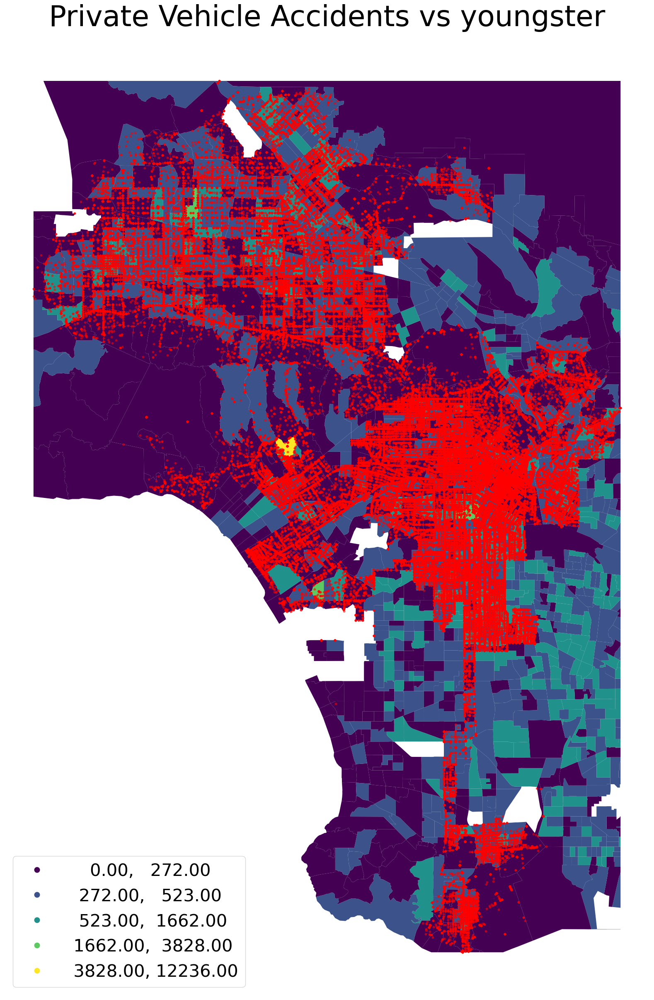

d:\Users\86188\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(


<Figure size 3000x3000 with 0 Axes>

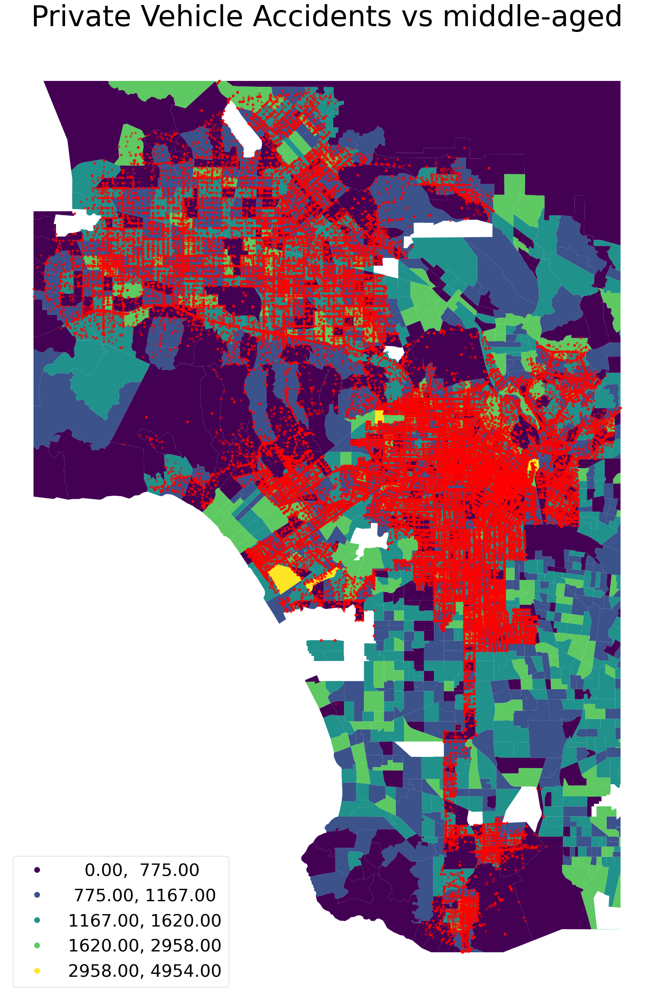

d:\Users\86188\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(


<Figure size 3000x3000 with 0 Axes>

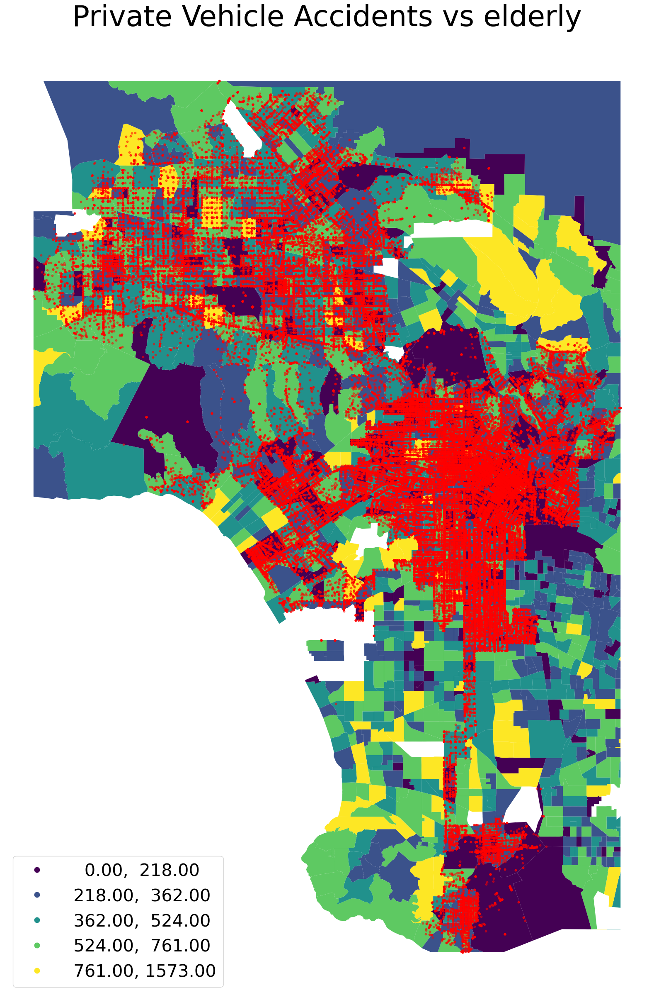

In [28]:
# Extract accident boundary points for cropping images and create age lists for drawing pictures
minx, miny, maxx, maxy = private_accidents_within_bounds.total_bounds
age_list = ['youngster', 'middle-aged', 'elderly']

# Creates a loop that serves to draw and save
for age in age_list:

    # create choropleth maps in geopandas
    plt.figure(figsize=(30, 30))
    ax = gdf_LA_AGE_DISTRIBUTION_with_all_ac.clip([minx, miny, maxx, maxy]).plot(
        column=age,
        legend=True,
        figsize=(30, 30),
        legend_kwds={'prop': {'size': 30}},  # Adjust the value to set the size of the legend font
        scheme='NaturalBreaks')


    private_accidents_within_bounds.plot(
        ax=ax, 
        marker='o', 
        color='red', 
        markersize=10, 
        alpha=0.5
    )

    ax.set_title('Private Vehicle Accidents vs {}'.format(age), fontdict={'fontsize': 50}, pad=20)
    ax.set_axis_off()

    plt.savefig('Private Vehicle Accidents vs {}'.format(age))
    plt.show()

d:\Users\86188\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=10.
  warnings.warn(


<Figure size 3000x3000 with 0 Axes>

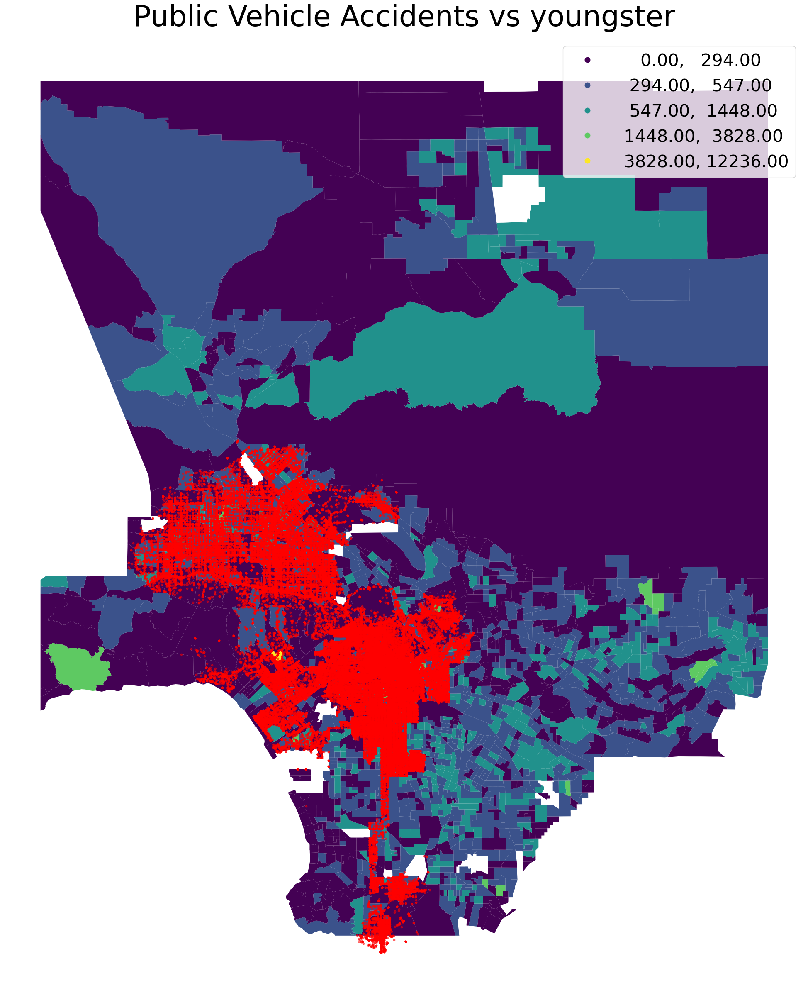

d:\Users\86188\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=10.
  warnings.warn(


<Figure size 3000x3000 with 0 Axes>

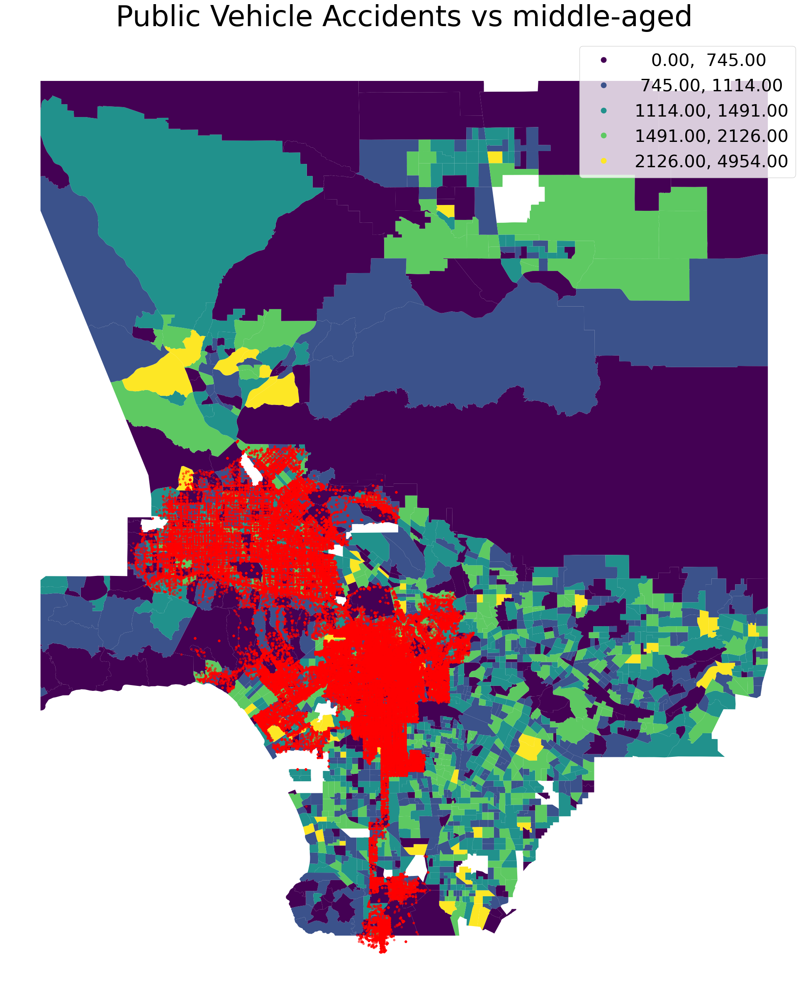

d:\Users\86188\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=10.
  warnings.warn(


<Figure size 3000x3000 with 0 Axes>

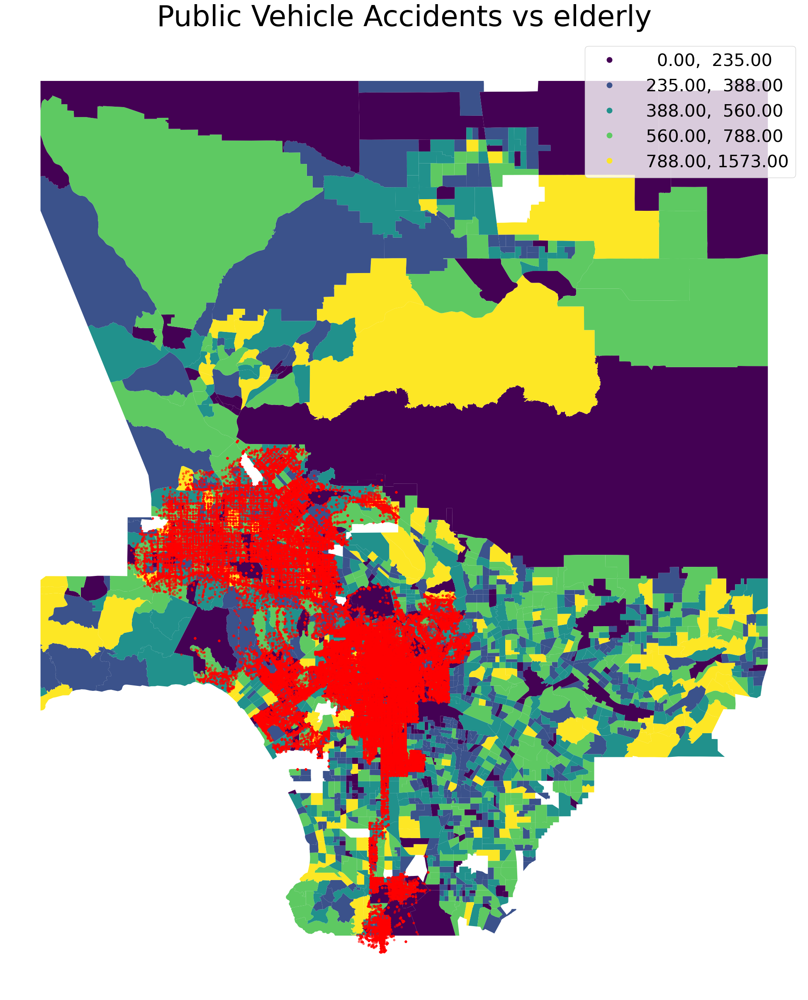

In [29]:
# Extract accident boundary points for cropping images and create age lists for drawing pictures
minx, miny, maxx, maxy = public_accidents_within_bounds.total_bounds
age_list = ['youngster', 'middle-aged', 'elderly']

# Creates a loop that serves to draw and save
for age in age_list:

    # create choropleth maps in geopandas
    plt.figure(figsize=(30, 30))
    ax = gdf_LA_AGE_DISTRIBUTION_with_all_ac.clip([minx, miny, maxx, maxy]).plot(
        column=age,
        legend=True,
        figsize=(30, 30),
        legend_kwds={'prop': {'size': 30}},  # Adjust the value to set the size of the legend font
        scheme='NaturalBreaks')


    private_accidents_within_bounds.plot(
        ax=ax, 
        marker='o', 
        color='red', 
        markersize=10, 
        alpha=0.5
    )

    ax.set_title('Public Vehicle Accidents vs {}'.format(age), fontdict={'fontsize': 50}, pad=20)
    ax.set_axis_off()

    plt.savefig('Public Vehicle Accidents vs {}'.format(age))
    plt.show()

# Further calculation of Moran value

In [30]:
# Copy the data for the next operations
cal_data = gdf_LA_AGE_DISTRIBUTION_with_all_ac.copy()

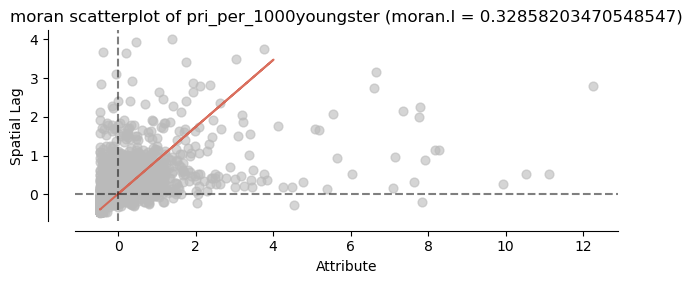

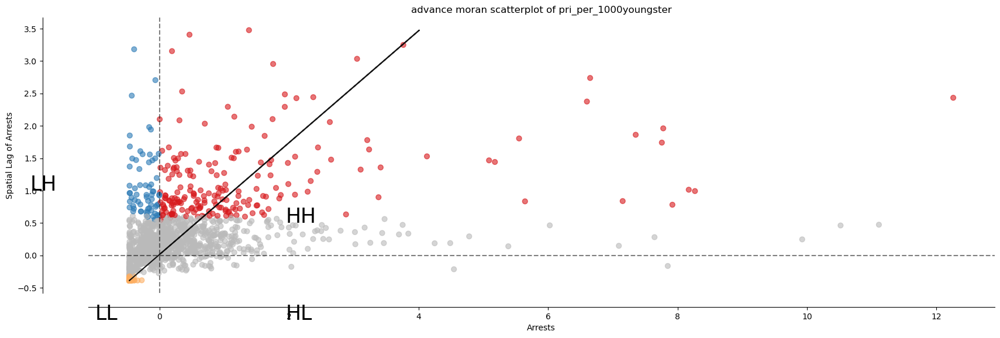

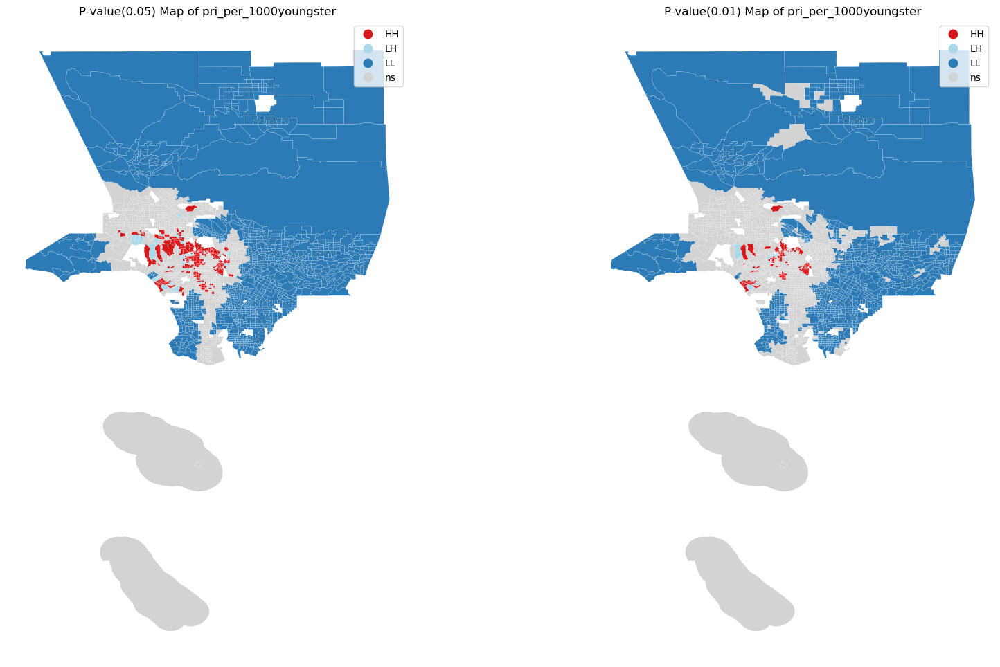

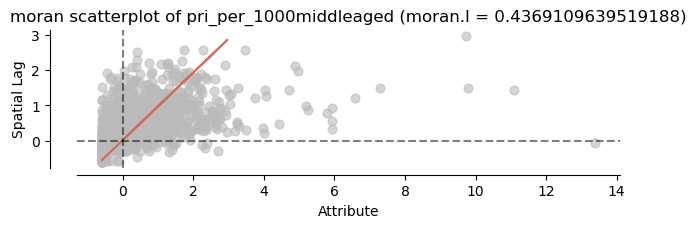

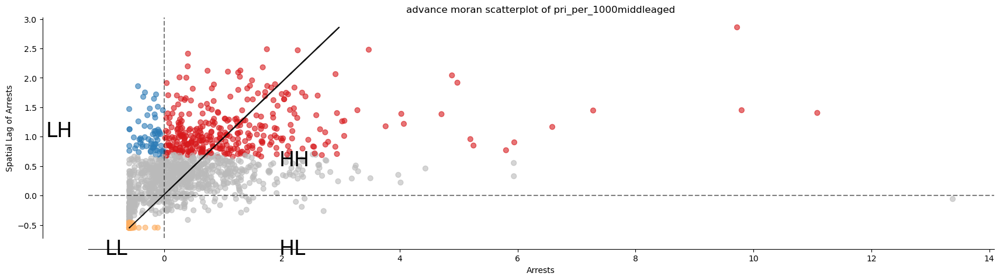

...

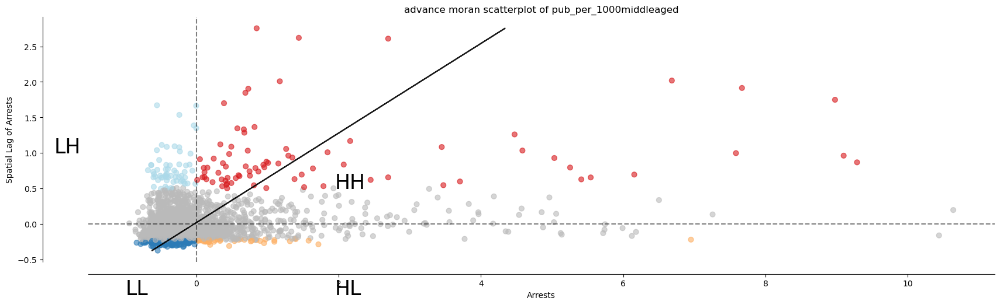

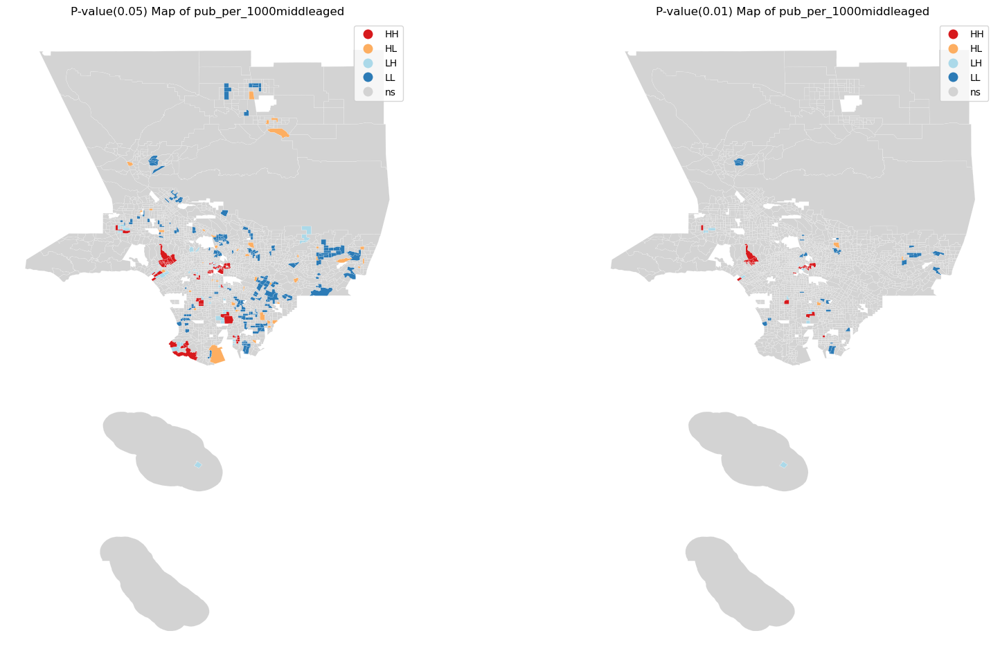

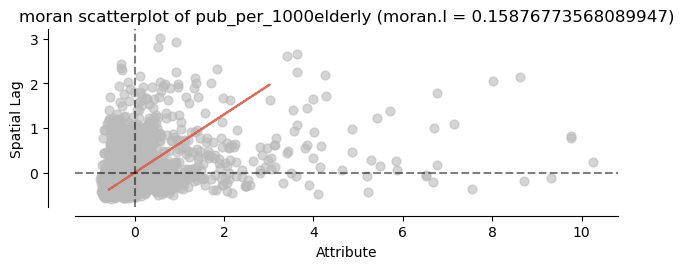

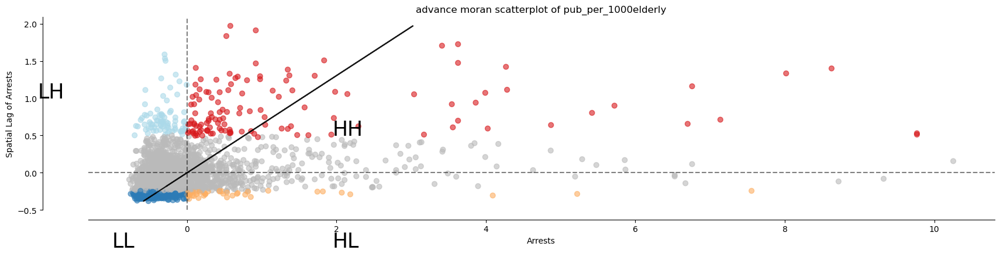

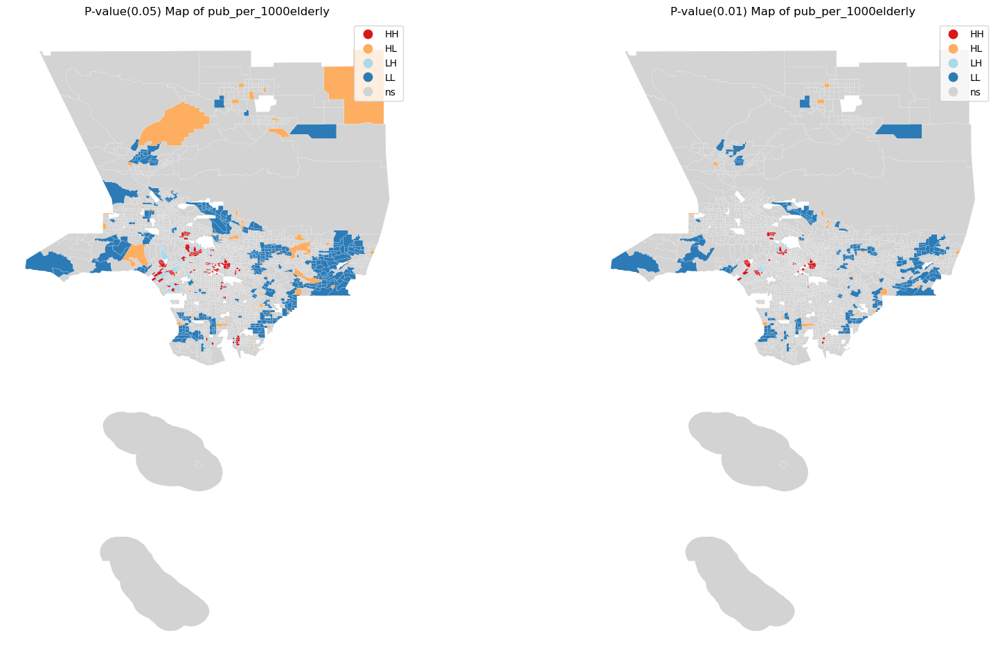

In [31]:
pri_1000 = ['pri_per_1000youngster', 'pri_per_1000middleaged', 'pri_per_1000elderly', 'pub_per_1000youngster', 'pub_per_1000middleaged', 'pub_per_1000elderly']

# Create a loop to plot Moran scatterplots
for p in pri_1000:

    # Copy the data for the next operations
    cal_data = gdf_LA_AGE_DISTRIBUTION_with_all_ac.copy()

    # Define the y variable
    y = cal_data[p]

    # Since the map range is too large and the incident points do not cover the whole LA, we need to remove some points that are too far away from the cluster value to minimize the error.
    # Calculate IQR and define thresholds for outliers
    new_coefficient = 20
    Q1 = y.quantile(0.25)
    Q3 = y.quantile(0.75)
    IQR = Q3 - Q1
    threshold_low = Q1 - new_coefficient * IQR
    threshold_high = Q3 + new_coefficient * IQR

    # exclude outliers
    y = y[(y > threshold_low) & (y < threshold_high)]

    # Re-index cal_data DataFrame based on y after removing outliers
    cal_data_cleaned = cal_data.loc[y.index]

    # Calculating spatial weights from a cleaned DataFrame
    wq = lps.weights.KNN.from_dataframe(cal_data_cleaned, k=8)

    # Standardize
    wq.transform = 'r'
    y = cal_data_cleaned[p]

    # Calculate Moran value
    moran = Moran(y, wq)
    I_m = moran.I


    fig, ax = moran_scatterplot(moran, aspect_equal=True)
    ax.set_title('moran scatterplot of {name} (moran.I = {number})'.format(name = p, number = I_m))

    plt.savefig('moran scatterplot of {}'.format(p))
    plt.show()

    # calculate local moran values
    lisa = esda.moran.Moran_Local(y, wq)
    # Plot
    fig,ax = plt.subplots(figsize=(20,15))

    moran_scatterplot(lisa, ax=ax, p=0.05)
    ax.set_xlabel("Arrests")
    ax.set_ylabel('Spatial Lag of Arrests')
    ax.set_title('advance moran scatterplot of {}'.format(p))

    # add some labels
    plt.text(1.95, 0.5, "HH", fontsize=25)
    plt.text(1.95, -1, "HL", fontsize=25)
    plt.text(-2, 1, "LH", fontsize=25)
    plt.text(-1, -1, "LL", fontsize=25)
    plt.savefig('advance moran scatterplot of {}'.format(p))
    plt.show()

    # create the 1x2 subplots
    fig, ax = plt.subplots(1, 2, figsize=(20, 12))

    # regular count map on the left
    lisa_cluster(lisa, cal_data_cleaned, p=0.05, ax=ax[0])

    ax[0].axis("off")
    ax[0].set_title("P-value(0.05) Map of {}".format(p))

    # spatial lag map on the right
    lisa_cluster(lisa, cal_data_cleaned, p=0.01, ax=ax[1])
    ax[1].axis("off")
    ax[1].set_title("P-value(0.01) Map of {}".format(p))
    plt.savefig('p-value map for {}'.format(p))
    plt.show()

# Comparative calculations for the two communities

In [32]:
# Copy the data for the next operations
comp_data = gdf_LA_AGE_DISTRIBUTION_with_all_ac.copy()

In [33]:
# Remove leading 0's from strings
comp_data['FIPS'] = comp_data['FIPS'].str.lstrip('0')  # 移除字符串前导的0
comp_data['FIPS'] = pd.to_numeric(comp_data['FIPS'], errors='coerce', downcast='integer')

In [34]:
# trimming the dataset into PACIFIC PALISADES Community
data_trimmed_PP = comp_data[comp_data['FIPS'].isin([6037262501, 6037262601, 6037262604, 6037262704, 6037262706, 6037262802])]
data_trimmed_PP

,OBJECTID,CT20,LABEL,ShapeSTArea,ShapeSTLength,geometry,FIPS,Total,Under 5 Years,5 to 9 Years,...,middle-aged,elderly,pri_count,pub_count,pri_per_1000youngster,pri_per_1000middleaged,pri_per_1000elderly,pub_per_1000youngster,pub_per_1000middleaged,pub_per_1000elderly
921,922,262501,2625.01,1.763535e+07,19927.672822,"POLYGON ((-118.52146 34.05646, -118.52220 34.0...",6037262501,3709,401,329,...,915,448,76,1,531.468531,83.060109,169.642857,6.993007,1.092896,2.232143
922,923,262601,2626.01,3.896831e+07,35450.354813,"POLYGON ((-118.56623 34.08226, -118.56736 34.0...",6037262601,3330,181,257,...,713,572,18,1,174.757282,25.245442,31.468531,9.708738,1.402525,1.748252
923,924,262604,2626.04,6.464711e+07,54533.465011,"POLYGON ((-118.55171 34.06502, -118.55186 34.0...",6037262604,5763,342,402,...,1496,673,186,1,1248.322148,124.331551,276.374443,6.711409,0.668449,1.485884
924,925,262704,2627.04,2.664162e+07,27170.130317,"POLYGON ((-118.52945 34.04889, -118.52943 34.0...",6037262704,3590,250,314,...,833,499,189,1,940.298507,226.890756,378.757515,4.975124,1.200480,2.004008
925,926,262706,2627.06,3.045457e+07,23707.304213,"POLYGON ((-118.51788 34.03004, -118.51794 34.0...",6037262706,3492,153,214,...,702,517,119,1,632.978723,169.515670,230.174081,5.319149,1.424501,1.934236
926,927,262802,2628.02,3.663825e+07,40121.078162,"POLYGON ((-118.49261 34.05321, -118.49253 34.0...",6037262802,3512,118,284,...,698,621,160,1,1616.161616,229.226361,257.648953,10.101010,1.432665,1.610306


youngster's index is:
[201, 188, 149, 143, 103, 99]
youngster's sum is:
883
youngster's mean is:
147.16666666666666


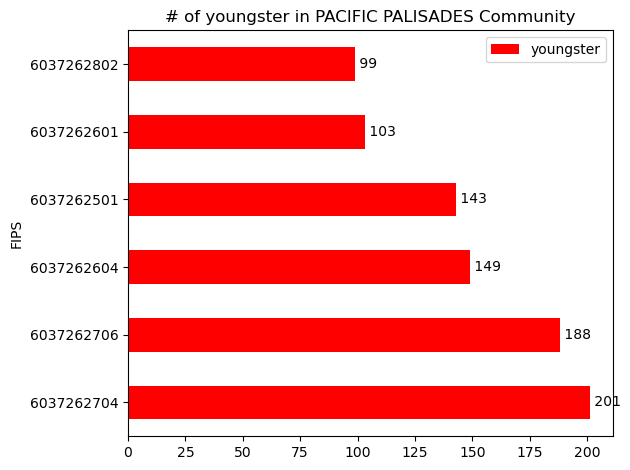

middle-aged's index is:
[1496, 915, 833, 713, 702, 698]
middle-aged's sum is:
5357
middle-aged's mean is:
892.8333333333334


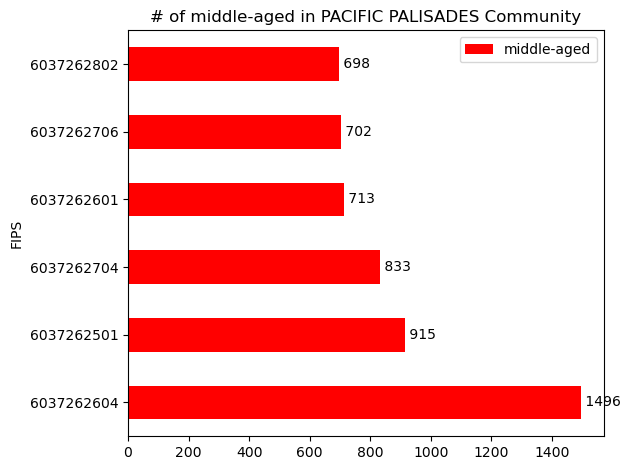

elderly's index is:
[673, 621, 572, 517, 499, 448]
elderly's sum is:
3330
elderly's mean is:
555.0


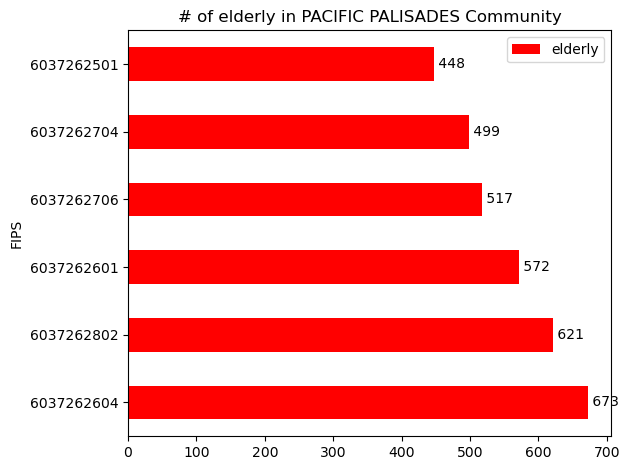

In [35]:
age = ['youngster', 'middle-aged', 'elderly']
numbers_age_P = []

# Create a loop to draw and save the image and print out the data we need at the same time.
for a in age:
    # define variable
    df_sorted = data_trimmed_PP.sort_values(by=a ,ascending = False)


    numbers_1 = []
    for i in df_sorted[a]:
        numbers_1.append(i)
    
    print("{}'s index is:".format(a))
    print(numbers_1)
    s = df_sorted[a].sum()
    m = df_sorted[a].mean()
    print("{}'s sum is:".format(a))
    print(s)
    numbers_age_P.append(s)
    print("{}'s mean is:".format(a))
    print(m)

    # make the figure looks better
    ax = df_sorted.plot.barh(x='FIPS',
                                y=a, 
                                title='# of {} in PACIFIC PALISADES Community'.format(a),
                                color='red')

    # add number for each column
    for i, bar in enumerate(ax.patches):
        plt.text(bar.get_width(),  # set the horizontal position to the end of the bar
                bar.get_y() + bar.get_height() / 2,  # set the vertical position to the center of the bar
                f' {numbers_1[i]}',  # display number
                va='center')  # center alignment

    plt.tight_layout()
    plt.savefig('Number of {} in PACIFIC PALISADES Community'.format(a))
    plt.show()

In [37]:
# trimming the dataset into PACIFIC PALISADES Community
data_trimmed_DL = comp_data[comp_data['FIPS'].isin([6037206051, 6037206052, 6037206201, 6037206202, 6037206301, 6037206302, 6037206303, 6037207303, 6037207304, 6037207305, 6037207306, 6037207307, 6037207308, 6037207501, 6037207502, 6037207711, 6037207712, 6037207901, 6037207902, 6037224010, 6037224020, 6037226001, 6037226002, 6037207400])]

youngster's index is:
[1152, 488, 441, 420, 393, 381, 350, 267, 204, 201, 138, 131, 129, 103, 93, 92, 91, 88, 80, 45, 42, 41, 30, 15]
youngster's sum is:
5415
youngster's mean is:
225.625


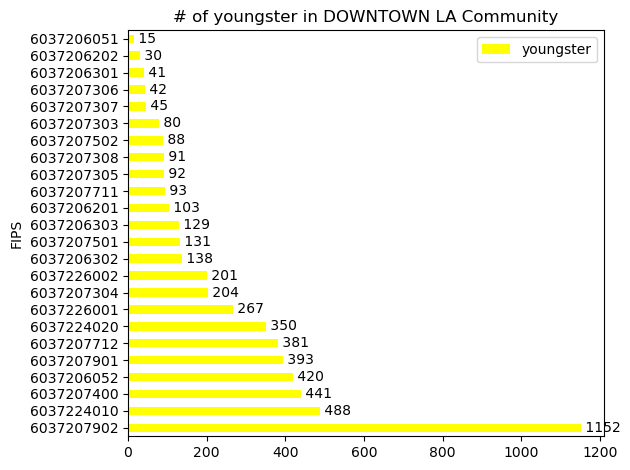

middle-aged's index is:
[3163, 1980, 1712, 1663, 1324, 1064, 1021, 1010, 853, 849, 846, 831, 831, 809, 808, 806, 805, 790, 760, 719, 619, 551, 503, 443]
middle-aged's sum is:
24760
middle-aged's mean is:
1031.6666666666667


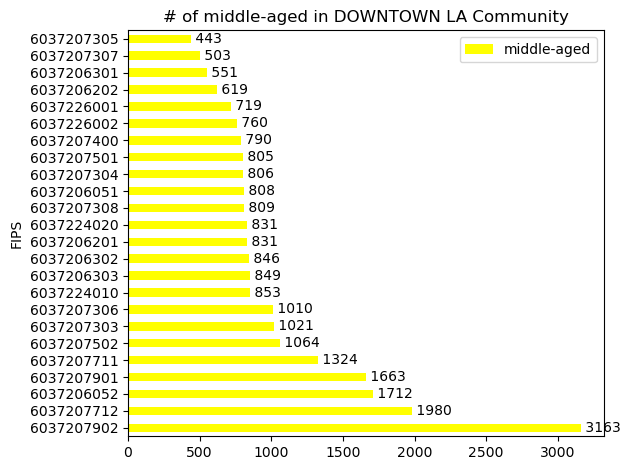

elderly's index is:
[753, 702, 468, 408, 360, 310, 276, 243, 214, 188, 168, 167, 166, 162, 158, 150, 137, 125, 124, 114, 56, 51, 50, 25]
elderly's sum is:
5575
elderly's mean is:
232.29166666666666


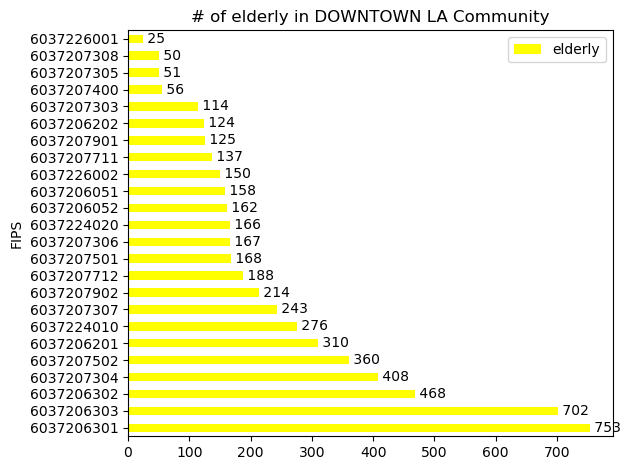

In [38]:
age = ['youngster', 'middle-aged', 'elderly']
numbers_age_L = []

# Create a loop to draw and save the image and print out the data we need at the same time.
for a in age:
    # define variable
    df_sorted = data_trimmed_DL.sort_values(by=a ,ascending = False)

    numbers_1 = []
    for i in df_sorted[a]:
        numbers_1.append(i)
    
    print("{}'s index is:".format(a))
    print(numbers_1)
    s = df_sorted[a].sum()
    numbers_age_L.append(s)
    m = df_sorted[a].mean()
    print("{}'s sum is:".format(a))
    print(s)
    print("{}'s mean is:".format(a))
    print(m)

    # make the figure looks better
    ax = df_sorted.plot.barh(x='FIPS',
                                y=a, 
                                title='# of {} in DOWNTOWN LA Community'.format(a),
                                color='yellow')

    # add number for each column
    for i, bar in enumerate(ax.patches):
        plt.text(bar.get_width(),  # set the horizontal position to the end of the bar
                bar.get_y() + bar.get_height() / 2,  # set the vertical position to the center of the bar
                f' {numbers_1[i]}',  # display number
                va='center')  # center alignment

    plt.tight_layout()
    plt.savefig('Number of {} in DOWNTOWN LA Community'.format(a))
    plt.show()



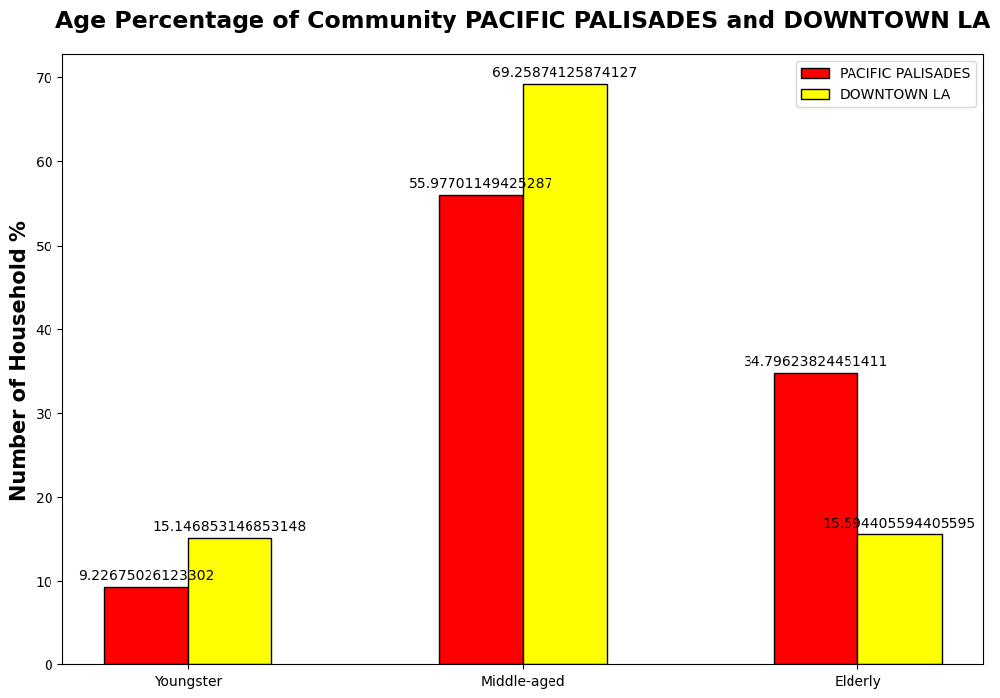

In [40]:
# Calculate the percentage of population within two communities
PACIFIC_PALISADES = []
DOWNTOWN_LA = []

for p in numbers_age_P:
    PACIFIC_PALISADES.append(((p/sum(numbers_age_P))*100))

for l in numbers_age_L:
    DOWNTOWN_LA.append(((l/sum(numbers_age_L))*100))

barWidth = 0.25
fig, ax = plt.subplots(figsize=(12, 8))

br1 = np.arange(len(PACIFIC_PALISADES))
br2 = [x + barWidth for x in br1]

bars1 = ax.bar(br1, PACIFIC_PALISADES, color='red', width=barWidth,
               edgecolor='black', label='PACIFIC PALISADES')
bars2 = ax.bar(br2, DOWNTOWN_LA, color='yellow', width=barWidth,
               edgecolor='black', label='DOWNTOWN LA')

ax.set_ylabel('Number of Household %', fontweight='bold', fontsize=15)
ax.set_xticks([r + barWidth/2 for r in range(len(PACIFIC_PALISADES))])
ax.set_xticklabels(['Youngster', 'Middle-aged', 'Elderly'])

ax.set_title('Age Percentage of Community PACIFIC PALISADES and DOWNTOWN LA', fontweight='bold', fontsize=17, pad=20)

# adding number on top of each bar
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), 
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels(bars1)
add_labels(bars2)

ax.legend()
plt.savefig('AGE Comparison')
plt.show()